# Generate maps and other figures

This notebook generates maps, figures and other outputs for the static clsutering of APPG-LBA project.

This noteboook uses `darribas/gds_py:6.0` Docker container.

In [1]:
import geopandas as gpd
import pandas as pd
import seaborn as sns
import contextily as ctx
from shapely.geometry import box, Point
import matplotlib.pyplot as plt
import rioxarray, xarray
import numpy as np

In [2]:
sns.set(context="paper", style='whitegrid')

## Load data

In [3]:
lsoa = gpd.read_file("../../data/lsoa_clustered.gpkg", driver="GPKG")

/opt/conda/lib/python3.8/site-packages/geopandas/geodataframe.py:577: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


In [4]:
lsoa_seq = pd.read_csv("../../data/LSOA_seq_lab.csv", index_col=0)

In [5]:
lsoa_seq

,LSOA11CD,LSOA11NM,clusters_12_2000,clusters_12_2006,clusters_12_2012,clusters_12_2018,change,sequence label
id,,,,,,,,
1,E01000001,City of London 001A,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,NaN,NaN
2,E01000002,City of London 001B,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,NaN,NaN
3,E01000003,City of London 001C,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,NaN,NaN
4,E01000005,City of London 001E,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,NaN,NaN
5,E01000006,Barking and Dagenham 016A,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,NaN,NaN
...,...,...,...,...,...,...,...,...
34749,W01001954,Cardiff 006F,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,NaN,NaN
34750,W01001955,Swansea 025F,Noncentral neighbourhoods,Noncentral neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,1.0,9713.0
34751,W01001956,Swansea 023E,Mixed countryside,Mixed countryside,Mixed countryside,Mixed countryside,NaN,NaN


In [6]:
lsoa['sequence'] = lsoa_seq['sequence label'].values

In [7]:
lba = pd.read_excel('../../data/LSOAs in LBA wards (1).xlsx')

In [8]:
lba

,LSOA Code,LSOA Name,LBA Code,LBA Name,LA Code,LA Name
0,E01000019,Barking and Dagenham 023A,E05000028,Becontree,E09000002,Barking and Dagenham
1,E01000020,Barking and Dagenham 023B,E05000028,Becontree,E09000002,Barking and Dagenham
2,E01000021,Barking and Dagenham 008A,E05000028,Becontree,E09000002,Barking and Dagenham
3,E01000022,Barking and Dagenham 008B,E05000028,Becontree,E09000002,Barking and Dagenham
4,E01000023,Barking and Dagenham 008C,E05000028,Becontree,E09000002,Barking and Dagenham
...,...,...,...,...,...,...
1463,E01012534,Warrington 006B,E05011040,Poplars and Hulme,E06000007,Warrington
1464,E01012535,Warrington 006C,E05011040,Poplars and Hulme,E06000007,Warrington
1465,E01012536,Warrington 008D,E05011040,Poplars and Hulme,E06000007,Warrington
1466,E01012537,Warrington 006D,E05011040,Poplars and Hulme,E06000007,Warrington


In [9]:
left_behind = lba["LSOA Code"].isin(lsoa.LSOA11CD)

In [10]:
lsoa['LBA'] = lsoa.LSOA11CD.isin(lba["LSOA Code"])

In [11]:
lsoa['final'] = lsoa_seq["clusters_12_2018"].values

In [12]:
lsoa['final'] = pd.Categorical(lsoa.final)

We also load data on major towns and cities.

In [11]:
cities = gpd.read_file("https://opendata.arcgis.com/datasets/5048387903bc49ca964cf04cd42b790d_0.zip?outSR=%7B%22latestWkid%22%3A27700%2C%22wkid%22%3A27700%7D")

HTTPError: HTTP Error 404: Not Found

### Static plot of classification of each town and city

We loop over all cities in `cities` dataframe and create a static plot.

In [17]:
for index, row in cities.iloc[55:].iterrows():
    if row.TCITY15NM == "London":
        xmin, ymin, xmax, ymax = row.geometry.bounds
    else:
        xmin, ymin, xmax, ymax = row.geometry.buffer(5000).bounds
    ax = lsoa.cx[xmin:xmax, ymin:ymax].plot("final", figsize=(15, 15), legend=True, alpha=.8, cmap='tab20', linewidth=.4, legend_kwds=dict(loc="upper left"),)
    lsoa[lsoa.LBA].plot(ax=ax, facecolor="none", edgecolor='r', linewidth=1, zorder=2)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()
    ctx.add_basemap(ax=ax, crs=27700, source=ctx.providers.Stamen.TonerLabels, zorder=1)
    ctx.add_basemap(ax=ax, crs=27700, source=ctx.providers.Stamen.TonerLines, zorder=-1)
    plt.savefig(f'../../maps/{row.TCITY15NM}_static_2018.png')
    plt.close()
    print(f"{row.TCITY15NM} done.")

Luton done.
Maidstone done.
Manchester done.
Mansfield done.
Middlesbrough done.
Milton Keynes done.
Newcastle upon Tyne done.
Newcastle-under-Lyme done.
Newport done.
Northampton done.
Norwich done.
Nottingham done.
Nuneaton done.
Oldham done.
Oxford done.
Peterborough done.
Plymouth done.
Poole done.
Portsmouth done.
Preston done.
Reading done.
Redditch done.
Rochdale done.
Rotherham done.
Salford done.
Scunthorpe done.
Sheffield done.
Shrewsbury done.
Slough done.
Solihull done.
South Shields done.
Southampton done.
Southend-on-Sea done.
Southport done.
St Albans done.
St Helens done.
Stevenage done.
Stockport done.
Stockton-on-Tees done.
Stoke-on-Trent done.
Sunderland done.
Sutton Coldfield done.
Swansea done.
Swindon done.
Telford done.
Wakefield done.
Walsall done.
Warrington done.
Watford done.
West Bromwich done.
Weston-Super-Mare done.
Wigan done.
Woking done.
Wolverhampton done.
Worcester done.
Worthing done.
York done.


In [13]:
lsoa['sequence'] = pd.Categorical(lsoa.sequence)

In [22]:
lsoa

,OBJECTID,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,Shape__Are,Shape__Len,...,clusters_10_2012,clusters_10_2018,clusters_12_2000,clusters_12_2006,clusters_12_2012,clusters_12_2018,geometry,sequence,LBA,final
0,1,E01000001,City of London 001A,532123,181632,-0.097140,51.5182,2635.767993,1.298653e+05,2635.767993,...,0,0,4,4,4,4,"POLYGON ((532151.537 181867.433, 532152.500 18...",NaN,False,Dense central neighbourhoods
1,2,E01000002,City of London 001B,532480,181715,-0.091970,51.5188,2707.881853,2.284196e+05,2707.881853,...,0,0,4,4,4,4,"POLYGON ((532634.497 181926.016, 532632.048 18...",NaN,False,Dense central neighbourhoods
2,3,E01000003,City of London 001C,532239,182033,-0.095320,51.5217,1224.638192,5.905435e+04,1224.638192,...,0,0,4,4,4,4,"POLYGON ((532153.703 182165.155, 532158.250 18...",NaN,False,Dense central neighbourhoods
3,4,E01000005,City of London 001E,533581,181283,-0.076270,51.5147,2275.805348,1.895777e+05,2275.805348,...,0,0,4,4,4,4,"POLYGON ((533619.062 181402.364, 533639.868 18...",NaN,False,Dense central neighbourhoods
4,5,E01000006,Barking and Dagenham 016A,544994,184274,0.089317,51.5387,1966.092607,1.465370e+05,1966.092607,...,1,1,5,5,5,5,"POLYGON ((545126.852 184310.838, 545145.213 18...",NaN,False,Noncentral neighbourhoods
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34748,34749,W01001954,Cardiff 006F,312959,180574,-3.255820,51.5173,5567.813286,6.400342e+05,5567.813286,...,1,1,5,5,5,5,"POLYGON ((312747.367 181262.100, 312751.477 18...",NaN,False,Noncentral neighbourhoods
34749,34750,W01001955,Swansea 025F,265633,193182,-3.942370,51.6214,6037.602710,6.871190e+05,6037.602710,...,0,0,5,5,4,4,"POLYGON ((265804.688 194161.261, 265815.000 19...",9713.0,False,Dense central neighbourhoods
34750,34751,W01001956,Swansea 023E,260586,192621,-4.015000,51.6151,13127.898240,2.500337e+06,13127.898240,...,4,4,2,2,2,2,"POLYGON ((259961.000 194979.500, 259969.094 19...",NaN,False,Mixed countryside
34751,34752,W01001957,Swansea 025G,265337,192555,-3.946400,51.6157,2829.597133,2.139171e+05,2829.597133,...,0,0,8,8,4,4,"POLYGON ((265154.000 192746.000, 265156.000 19...",9696.0,False,Dense central neighbourhoods


We do the same for sequential clustering.

In [80]:
for index, row in cities.iterrows():
    if row.TCITY15NM == "London":
        xmin, ymin, xmax, ymax = row.geometry.bounds
    else:
        xmin, ymin, xmax, ymax = row.geometry.buffer(5000).bounds
    ax = lsoa.cx[xmin:xmax, ymin:ymax].plot("sequence", figsize=(15, 15), legend=True, alpha=.8, cmap='tab20', linewidth=.4, legend_kwds=dict(loc="upper left"),)
    lsoa[lsoa.LBA].plot(ax=ax, facecolor="none", edgecolor='r', linewidth=1, zorder=2)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()
    ctx.add_basemap(ax=ax, crs=27700, source=ctx.providers.Stamen.TonerLabels, zorder=1)
    ctx.add_basemap(ax=ax, crs=27700, source=ctx.providers.Stamen.TonerLines, zorder=-1)
    plt.savefig(f'../../maps/{row.TCITY15NM}_sequence.png')
    plt.close()
    print(f"{row.TCITY15NM} done.")

Barnsley done.
Basildon done.
Basingstoke done.
Bath done.
Bedford done.
Birkenhead done.
Birmingham done.
Blackburn done.
Blackpool done.
Bolton done.
Bournemouth done.
Bracknell done.
Bradford done.
Brighton and Hove done.
Bristol done.
Burnley done.
Burton upon Trent done.
Bury done.
Cambridge done.
Cardiff done.
Carlisle done.
Chatham done.
Chelmsford done.
Cheltenham done.
Chester done.
Chesterfield done.
Colchester done.
Coventry done.
Crawley done.
Darlington done.
Derby done.
Doncaster done.
Dudley done.
Eastbourne done.
Exeter done.
Gateshead done.
Gillingham done.
Gloucester done.
Grimsby done.
Guildford done.
Halifax done.
Harlow done.
Harrogate done.
Hartlepool done.
Hastings done.
Hemel Hempstead done.
High Wycombe done.
Huddersfield done.
Ipswich done.
Kingston upon Hull done.
Leeds done.
Leicester done.
Lincoln done.
Liverpool done.
London done.
Luton done.
Maidstone done.
Manchester done.
Mansfield done.
Middlesbrough done.
Milton Keynes done.
Newcastle upon Tyne done.


We load Sentinel 2 composite image needed to generate sky portraits.

In [121]:
local_dir = "../../../urbangrammar_samba/ghs_composite_s2/"
r = rioxarray.open_rasterio(local_dir+"GHS-composite-S2.vrt")

In [87]:
lsoa_clc2018 = gpd.read_parquet("../../data/clustering_phase_1/lsoa_clc2018.pq")
labels = gpd.read_file("../../data/lsoa_clustered.gpkg")

/opt/conda/lib/python3.8/site-packages/geopandas/geodataframe.py:577: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


In [90]:
lsoa_clc2018['clusters'] = pd.Categorical(labels.clusters_12_2018.values)

We filter out Wales to keep only LSOAs in England

In [93]:
engl = labels.LSOA11CD.str.startswith('E')
df = lsoa_clc2018[engl]

We compute cluster centroids.

In [98]:
means = df.groupby('clusters').mean()

In [99]:
means

,land_cover_112,land_cover_322,land_cover_211,land_cover_231,land_cover_311,land_cover_312,land_cover_331,land_cover_423,land_cover_313,land_cover_421,...,land_cover_122,land_cover_511,land_cover_512,land_cover_132,land_cover_333,land_cover_332,land_cover_523,land_cover_334,land_cover_222,land_cover_244
clusters,,,,,,,,,,,,,,,,,,,,,
0,0.512049,0.000344,0.004799,0.005377,0.005780,0.000094,0.000340,0.000408,0.001508,1.222252e-07,...,0.002472,0.000047,0.003421,3.380575e-05,0.000000e+00,0.000000,0.000044,0.0,0.000121,0.000000
1,0.496491,0.001257,0.033377,0.401449,0.014450,0.001529,0.000035,0.000830,0.003246,9.371870e-04,...,0.001463,0.000038,0.001804,2.211291e-04,7.167808e-08,0.000019,0.000167,0.0,0.000256,0.000000
2,0.182702,0.058149,0.055053,0.146580,0.138322,0.044918,0.002658,0.004088,0.033839,8.426859e-03,...,0.008902,0.000181,0.018509,2.023753e-03,3.494341e-03,0.000140,0.000879,0.0,0.002376,0.000000
3,0.075672,0.001742,0.763743,0.081448,0.013921,0.004413,0.000031,0.000850,0.006309,1.809070e-03,...,0.001070,0.000142,0.002580,4.468286e-04,9.815213e-05,0.000006,0.000105,0.0,0.001008,0.000006
4,0.185107,0.000000,0.000547,0.002721,0.000305,0.000000,0.000225,0.001874,0.000000,7.157317e-08,...,0.000640,0.000286,0.000133,0.000000e+00,0.000000e+00,0.000000,0.000105,0.0,0.000000,0.000000
5,0.979415,0.000091,0.003297,0.003920,0.000895,0.000044,0.000013,0.000241,0.000169,2.997045e-05,...,0.000275,0.000070,0.000056,3.174504e-07,1.459167e-06,0.000000,0.000088,0.0,0.000001,0.000000
6,0.329963,0.000409,0.022093,0.029061,0.005403,0.000532,0.000000,0.000505,0.000707,8.988704e-04,...,0.003348,0.000245,0.002542,3.078923e-04,1.397016e-05,0.000000,0.000164,0.0,0.000215,0.000000
7,0.450698,0.000963,0.430656,0.038021,0.011657,0.001501,0.000171,0.001170,0.004207,5.264623e-04,...,0.001317,0.000076,0.001811,3.698371e-04,1.392638e-05,0.000000,0.000162,0.0,0.000917,0.000000
8,0.735124,0.001977,0.034572,0.039994,0.018809,0.001389,0.000964,0.001389,0.003606,6.907061e-04,...,0.004003,0.000178,0.002111,5.295398e-05,1.373838e-05,0.000000,0.000197,0.0,0.000227,0.000000


In [171]:
from rioxarray.merge import merge_arrays

In [224]:
def minmax(a, 
           bottom=0, 
           top=255, 
           min_cut=2.5, 
           max_cut=98.5
          ):
    vals = a.to_series().values
    min_bin = np.percentile(vals, min_cut)
    max_bin = np.percentile(vals, max_cut)
    a = xarray.where(a > max_bin, max_bin, a)
    a = xarray.where(a < min_bin, min_bin, a)
    a_std = (a) / (1400)
    a_scaled = a_std * (top - bottom) + bottom
    return a_scaled.astype(int)

For each cluster, we plot 6 observations closest to the cluster centroid.

In [226]:
for cat in df.clusters.cat.categories:
    cl = df[df.clusters == cat].drop(columns=['clusters', 'geometry'])
    cl['deviations'] = [abs(cl.iloc[x] - means.loc[0]).sum() for x in range(len(cl))]
    cl = cl.sort_values('deviations')

    fig, axs = plt.subplots(6, 1, figsize=(5, 35))
    for i, ax in enumerate(axs.flatten()):
        g = cl.iloc[i].name
        xmin, ymin, xmax, ymax = df.loc[g].geometry.bounds
        if xmax - xmin > ymax - ymin:
            buf = (xmax - xmin) / 2
        else:
            buf = (ymax - ymin) / 2
        sat = r.sel(band=[1, 2, 3]).rio.clip_box(*df.loc[g].geometry.centroid.buffer(buf+250).bounds)
        sat.groupby("band")\
           .map(minmax).plot.imshow(ax=ax, rgb="band")
        df.loc[[g]].plot(ax=ax, facecolor='none', edgecolor='r')
        geom = df.loc[g].geometry
        mask = df.loc[g].geometry.centroid.buffer(buf+260, join_style=3, cap_style=3).difference(geom)
        gpd.GeoSeries([mask]).plot(ax=ax, color='w', alpha=.6)
        ax.set_axis_off()
        ax.set_title("")
    plt.savefig(f'../../maps/sat_{cat}.png', bbox_inches="tight")
    plt.close()
    print(cat)
            

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


11


Create a static clustering map of Liverpool area focused on LBAs.

In [26]:
geom = cities[cities.TCITY15NM == "Liverpool"].geometry.iloc[0]

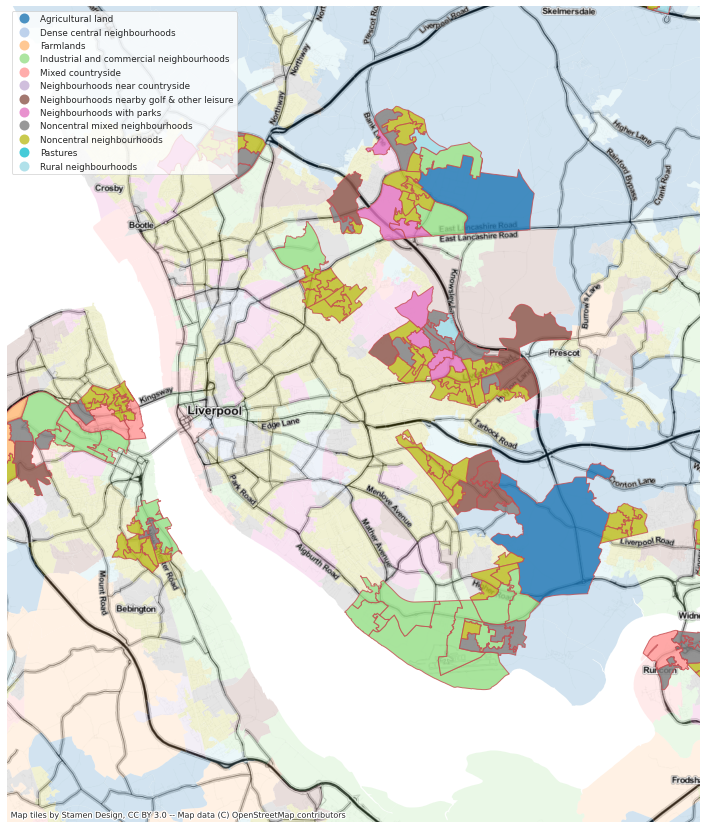

In [34]:
xmin, ymin, xmax, ymax = geom.buffer(5000).bounds
ax = lsoa.cx[xmin:xmax, ymin:ymax].plot("final", figsize=(15, 15), cmap='tab20', linewidth=.4, alpha=.2)
lsoa[lsoa.LBA].plot("final",ax=ax, alpha=.8, cmap='tab20', edgecolor='r', linewidth=1, zorder=2, legend=True,legend_kwds=dict(loc="upper left"), )
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.set_axis_off()
ctx.add_basemap(ax=ax, crs=27700, source=ctx.providers.Stamen.TonerLabels, zorder=1)
ctx.add_basemap(ax=ax, crs=27700, source=ctx.providers.Stamen.TonerLines, zorder=-1)
plt.savefig(f'../../maps/Liverpool_static_2018_LBA.png')

Create a sequence clustering map of Liverpool area focused on LBAs.

In [14]:
mapping = {51: "Suburbanisation",
          84: "Agricultural Diversification",
            111: "Rural Urbanisation",
            486: "Diversifying Countryside",
            9136: "Leisure Space Creation",
            9201: "Localised Industrialisation",
            9517: "Pasture Intensification",
            9537: "Green Urbanisation",
            9665: "Increasing Agricultural Land",
            9696: "Greener Non-central Neighbourhoods",
            9713: "Consolidating Non-central Neighbourhoods",}

In [15]:
lsoa.sequence = lsoa.sequence.replace(mapping)

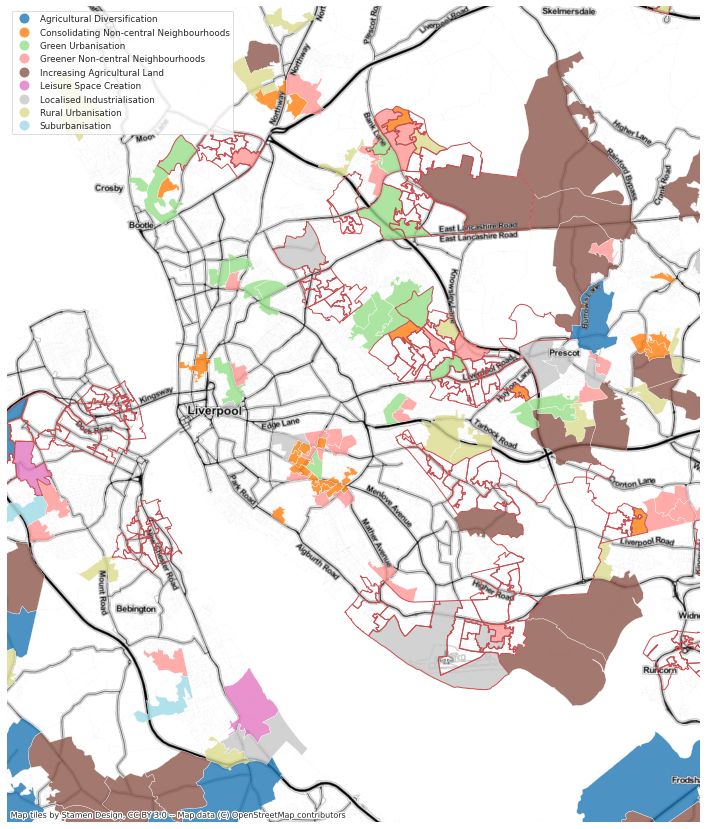

In [42]:
    ax = lsoa.cx[xmin:xmax, ymin:ymax].plot("sequence", figsize=(15, 15), legend=True, alpha=.8, cmap='tab20', linewidth=.4, legend_kwds=dict(loc="upper left"),)
    lsoa[lsoa.LBA].plot(ax=ax, facecolor="none", edgecolor='r', linewidth=1, zorder=2)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()
    ctx.add_basemap(ax=ax, crs=27700, source=ctx.providers.Stamen.TonerLabels, zorder=1)
    ctx.add_basemap(ax=ax, crs=27700, source=ctx.providers.Stamen.TonerLines, zorder=-1)
    plt.savefig(f'../../maps/Liverpool_sequence.png', dpi=150)
#     plt.close()
#     print(f"{row.TCITY15NM} done.")

## Heatmaps

This section creates heatmaps/tables illustrating the distributions of data.

In [45]:
c00 = lsoa.clusters_12_2000.value_counts(normalize=True)
c06 = lsoa.clusters_12_2006.value_counts(normalize=True)
c12 = lsoa.clusters_12_2012.value_counts(normalize=True)
c18 = lsoa.clusters_12_2018.value_counts(normalize=True)

In [46]:
heat_lsoa = pd.DataFrame([c00, c06, c12, c18]).T.sort_index()

In [47]:
lbas = lsoa[lsoa.LBA]
c00 = lbas.clusters_12_2000.value_counts(normalize=True)
c06 = lbas.clusters_12_2006.value_counts(normalize=True)
c12 = lbas.clusters_12_2012.value_counts(normalize=True)
c18 = lbas.clusters_12_2018.value_counts(normalize=True)
heat_lbas = pd.DataFrame([c00, c06, c12, c18]).T.sort_index()

In [48]:
heat_lsoa.columns = [2000, 2006, 2012, 2018]

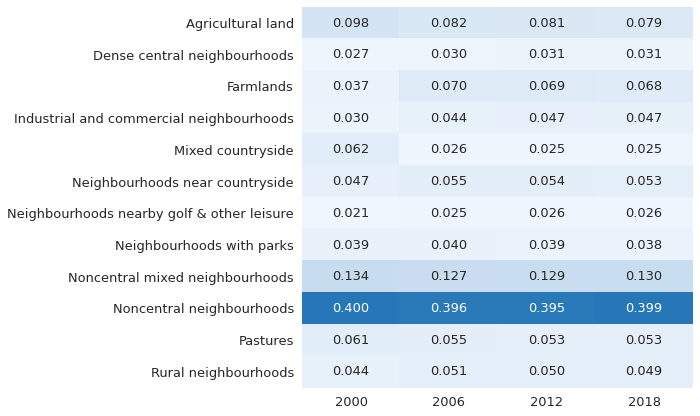

In [51]:
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(heat_lsoa, ax=ax, annot=True, cmap='Blues', vmin=0, vmax=.55, cbar=False, annot_kws=dict(fontsize=13), fmt='.3f')
plt.yticks(fontsize=13)
plt.xticks(fontsize=13,)
plt.savefig('../../diagrams/proportion_lsoa.png', dpi=300, bbox_inches="tight")

In [238]:
c00 = lsoa.clusters_12_2000.value_counts(normalize=False)
c06 = lsoa.clusters_12_2006.value_counts(normalize=False)
c12 = lsoa.clusters_12_2012.value_counts(normalize=False)
c18 = lsoa.clusters_12_2018.value_counts(normalize=False)
prop_lsoa = pd.DataFrame([c00, c06, c12, c18]).T
prop_lsoa.columns = [2000, 2006, 2012, 2018]

prop_lsoa = (prop_lsoa.sum(axis=1) / len(lsoa)) / 4

In [239]:
prop_lsoa

Agricultural land                             0.085320
Dense central neighbourhoods                  0.029579
Farmlands                                     0.061000
Industrial and commercial neighbourhoods      0.042108
Mixed countryside                             0.034626
Neighbourhoods near countryside               0.052361
Neighbourhoods nearby golf & other leisure    0.024472
Neighbourhoods with parks                     0.038904
Noncentral mixed neighbourhoods               0.130138
Noncentral neighbourhoods                     0.397607
Pastures                                      0.055444
Rural neighbourhoods                          0.048441
dtype: float64

In [240]:
lsoa

,OBJECTID,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,Shape__Are,Shape__Len,...,clusters_10_2012,clusters_10_2018,clusters_12_2000,clusters_12_2006,clusters_12_2012,clusters_12_2018,geometry,sequence,LBA,final
0,Neighbourhoods near countryside,E01000001,City of London 001A,532123,181632,-0.097140,51.5182,2635.767993,129865.314354,2635.767993,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((532151.537 181867.433, 532152.500 18...",NaN,False,Dense central neighbourhoods
1,Mixed countryside,E01000002,City of London 001B,532480,181715,-0.091970,51.5188,2707.881853,228419.634727,2707.881853,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((532634.497 181926.016, 532632.048 18...",NaN,False,Dense central neighbourhoods
2,Agricultural land,E01000003,City of London 001C,532239,182033,-0.095320,51.5217,1224.638192,59054.351929,1224.638192,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((532153.703 182165.155, 532158.250 18...",NaN,False,Dense central neighbourhoods
3,Dense central neighbourhoods,E01000005,City of London 001E,533581,181283,-0.076270,51.5147,2275.805348,189577.710655,2275.805348,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((533619.062 181402.364, 533639.868 18...",NaN,False,Dense central neighbourhoods
4,Noncentral neighbourhoods,E01000006,Barking and Dagenham 016A,544994,184274,0.089317,51.5387,1966.092607,146536.995750,1966.092607,...,Neighbourhoods near countryside,Neighbourhoods near countryside,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,"POLYGON ((545126.852 184310.838, 545145.213 18...",NaN,False,Noncentral neighbourhoods
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32968,32969,E01033748,Liverpool 050I,335220,387649,-2.975330,53.3817,4330.800070,483514.002792,4330.800070,...,Dense central neighbourhoods,Dense central neighbourhoods,Mixed countryside,Mixed countryside,Mixed countryside,Mixed countryside,"MULTIPOLYGON (((334617.399 388176.905, 334607....",NaN,False,Mixed countryside
32969,32970,E01033749,Liverpool 042F,338677,387900,-2.923420,53.3844,2340.702574,202683.753227,2340.702574,...,Agricultural land,Agricultural land,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,"POLYGON ((338929.000 388182.000, 338936.000 38...",Greener Non-central Neighbourhoods,False,Noncentral mixed neighbourhoods
32970,32971,E01033750,Liverpool 061A,334568,388937,-2.985400,53.3932,4937.800257,493691.197838,4937.800257,...,Dense central neighbourhoods,Dense central neighbourhoods,Mixed countryside,Mixed countryside,Mixed countryside,Mixed countryside,"POLYGON ((334442.091 389502.020, 334489.805 38...",NaN,False,Mixed countryside
32971,32972,E01033751,Liverpool 062A,333990,391269,-2.994580,53.4141,4360.410024,597556.173294,4360.410024,...,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,Industrial and commercial neighbourhoods,Industrial and commercial neighbourhoods,Industrial and commercial neighbourhoods,Industrial and commercial neighbourhoods,"POLYGON ((334674.977 391540.458, 334679.726 39...",NaN,False,Industrial and commercial neighbourhoods


In [ ]:
c00 = lsoa.groupby("clusters_12_2000")

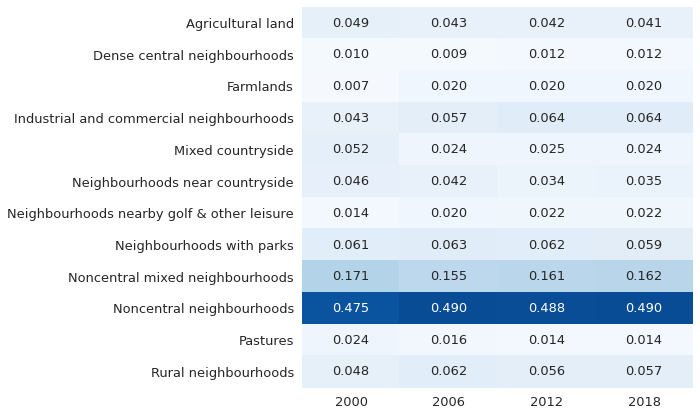

In [52]:
heat_lbas.columns = [2000, 2006, 2012, 2018]

fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(heat_lbas, ax=ax, annot=True, cmap='Blues', vmin=0, vmax=.55, cbar=False, annot_kws=dict(fontsize=13), fmt='.3f')
plt.yticks(fontsize=13)
plt.xticks(fontsize=13,)
plt.savefig('../../diagrams/proportion_lba.png', dpi=300, bbox_inches="tight")

In [32]:
imd = pd.read_csv("c12.IMD.csv")

In [34]:
imd

,LSOA11CD,LSOA11NM,IMD score,10% IMD,Left.Behind,change,2000,2006,2012,2018,sequence label
0,E01000048,Barking and Dagenham 021B,44.704,1,0,0,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,NaN
1,E01000061,Barking and Dagenham 006C,46.283,1,0,0,Neighbourhoods with parks,Neighbourhoods with parks,Neighbourhoods with parks,Neighbourhoods with parks,NaN
2,E01000093,Barking and Dagenham 022B,46.922,1,0,0,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,NaN
3,E01000105,Barking and Dagenham 014C,44.149,1,0,1,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,9713.0
4,E01000221,Barnet 039B,45.842,1,0,1,Noncentral mixed neighbourhoods,Industrial and commercial neighbourhoods,Industrial and commercial neighbourhoods,Industrial and commercial neighbourhoods,921.0
...,...,...,...,...,...,...,...,...,...,...,...
3471,W01001886,Trowbridge 10,52.700,1,0,0,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,NaN
3472,W01001924,Glanymor 4,57.100,1,0,0,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,NaN
3473,W01001928,Abergele Pensarn 2,57.000,1,0,0,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,NaN
3474,W01001931,Smithfield 3,46.600,1,0,0,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,NaN


In [53]:
deprivated = lsoa[lsoa.LSOA11CD.isin(imd.LSOA11CD)]
c00 = deprivated.clusters_12_2000.value_counts(normalize=True)
c06 = deprivated.clusters_12_2006.value_counts(normalize=True)
c12 = deprivated.clusters_12_2012.value_counts(normalize=True)
c18 = deprivated.clusters_12_2018.value_counts(normalize=True)
heat_deprivated = pd.DataFrame([c00, c06, c12, c18]).T.sort_index()

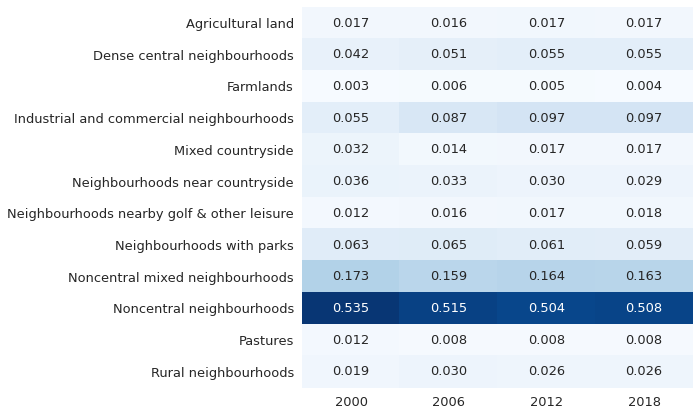

In [55]:
heat_deprivated.columns = [2000, 2006, 2012, 2018]
 
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(heat_deprivated, ax=ax, annot=True, cmap='Blues', vmin=0, vmax=.55, cbar=False, annot_kws=dict(fontsize=13), fmt='.3f')
plt.yticks(fontsize=13)
plt.xticks(fontsize=13,)
plt.savefig('../../diagrams/proportion_deprivated.png', dpi=300, bbox_inches="tight")

In [19]:
mapping = dict(zip(lsoa.clusters_12_2018, lsoa.final))

In [20]:
lsoa = lsoa.replace(mapping)

In [21]:
lsoa

,OBJECTID,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,Shape__Are,Shape__Len,...,clusters_10_2012,clusters_10_2018,clusters_12_2000,clusters_12_2006,clusters_12_2012,clusters_12_2018,geometry,sequence,LBA,final
0,Neighbourhoods near countryside,E01000001,City of London 001A,532123,181632,-0.097140,51.5182,2635.767993,1.298653e+05,2635.767993,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((532151.537 181867.433, 532152.500 18...",NaN,False,Dense central neighbourhoods
1,Mixed countryside,E01000002,City of London 001B,532480,181715,-0.091970,51.5188,2707.881853,2.284196e+05,2707.881853,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((532634.497 181926.016, 532632.048 18...",NaN,False,Dense central neighbourhoods
2,Agricultural land,E01000003,City of London 001C,532239,182033,-0.095320,51.5217,1224.638192,5.905435e+04,1224.638192,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((532153.703 182165.155, 532158.250 18...",NaN,False,Dense central neighbourhoods
3,Dense central neighbourhoods,E01000005,City of London 001E,533581,181283,-0.076270,51.5147,2275.805348,1.895777e+05,2275.805348,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((533619.062 181402.364, 533639.868 18...",NaN,False,Dense central neighbourhoods
4,Noncentral neighbourhoods,E01000006,Barking and Dagenham 016A,544994,184274,0.089317,51.5387,1966.092607,1.465370e+05,1966.092607,...,Neighbourhoods near countryside,Neighbourhoods near countryside,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,"POLYGON ((545126.852 184310.838, 545145.213 18...",NaN,False,Noncentral neighbourhoods
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34748,34749,W01001954,Cardiff 006F,312959,180574,-3.255820,51.5173,5567.813286,6.400342e+05,5567.813286,...,Neighbourhoods near countryside,Neighbourhoods near countryside,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,"POLYGON ((312747.367 181262.100, 312751.477 18...",NaN,False,Noncentral neighbourhoods
34749,34750,W01001955,Swansea 025F,265633,193182,-3.942370,51.6214,6037.602710,6.871190e+05,6037.602710,...,Neighbourhoods with parks,Neighbourhoods with parks,Noncentral neighbourhoods,Noncentral neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((265804.688 194161.261, 265815.000 19...",Consolidating Non-central Neighbourhoods,False,Dense central neighbourhoods
34750,34751,W01001956,Swansea 023E,260586,192621,-4.015000,51.6151,13127.898240,2.500337e+06,13127.898240,...,Dense central neighbourhoods,Dense central neighbourhoods,Mixed countryside,Mixed countryside,Mixed countryside,Mixed countryside,"POLYGON ((259961.000 194979.500, 259969.094 19...",NaN,False,Mixed countryside
34751,34752,W01001957,Swansea 025G,265337,192555,-3.946400,51.6157,2829.597133,2.139171e+05,2829.597133,...,Neighbourhoods with parks,Neighbourhoods with parks,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((265154.000 192746.000, 265156.000 19...",Greener Non-central Neighbourhoods,False,Dense central neighbourhoods


In [22]:
lsoa = lsoa[lsoa.LSOA11CD.str.startswith('E')]

In [23]:
lsoa

,OBJECTID,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,Shape__Are,Shape__Len,...,clusters_10_2012,clusters_10_2018,clusters_12_2000,clusters_12_2006,clusters_12_2012,clusters_12_2018,geometry,sequence,LBA,final
0,Neighbourhoods near countryside,E01000001,City of London 001A,532123,181632,-0.097140,51.5182,2635.767993,129865.314354,2635.767993,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((532151.537 181867.433, 532152.500 18...",NaN,False,Dense central neighbourhoods
1,Mixed countryside,E01000002,City of London 001B,532480,181715,-0.091970,51.5188,2707.881853,228419.634727,2707.881853,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((532634.497 181926.016, 532632.048 18...",NaN,False,Dense central neighbourhoods
2,Agricultural land,E01000003,City of London 001C,532239,182033,-0.095320,51.5217,1224.638192,59054.351929,1224.638192,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((532153.703 182165.155, 532158.250 18...",NaN,False,Dense central neighbourhoods
3,Dense central neighbourhoods,E01000005,City of London 001E,533581,181283,-0.076270,51.5147,2275.805348,189577.710655,2275.805348,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((533619.062 181402.364, 533639.868 18...",NaN,False,Dense central neighbourhoods
4,Noncentral neighbourhoods,E01000006,Barking and Dagenham 016A,544994,184274,0.089317,51.5387,1966.092607,146536.995750,1966.092607,...,Neighbourhoods near countryside,Neighbourhoods near countryside,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,"POLYGON ((545126.852 184310.838, 545145.213 18...",NaN,False,Noncentral neighbourhoods
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32968,32969,E01033748,Liverpool 050I,335220,387649,-2.975330,53.3817,4330.800070,483514.002792,4330.800070,...,Dense central neighbourhoods,Dense central neighbourhoods,Mixed countryside,Mixed countryside,Mixed countryside,Mixed countryside,"MULTIPOLYGON (((334617.399 388176.905, 334607....",NaN,False,Mixed countryside
32969,32970,E01033749,Liverpool 042F,338677,387900,-2.923420,53.3844,2340.702574,202683.753227,2340.702574,...,Agricultural land,Agricultural land,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,"POLYGON ((338929.000 388182.000, 338936.000 38...",Greener Non-central Neighbourhoods,False,Noncentral mixed neighbourhoods
32970,32971,E01033750,Liverpool 061A,334568,388937,-2.985400,53.3932,4937.800257,493691.197838,4937.800257,...,Dense central neighbourhoods,Dense central neighbourhoods,Mixed countryside,Mixed countryside,Mixed countryside,Mixed countryside,"POLYGON ((334442.091 389502.020, 334489.805 38...",NaN,False,Mixed countryside
32971,32972,E01033751,Liverpool 062A,333990,391269,-2.994580,53.4141,4360.410024,597556.173294,4360.410024,...,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,Industrial and commercial neighbourhoods,Industrial and commercial neighbourhoods,Industrial and commercial neighbourhoods,Industrial and commercial neighbourhoods,"POLYGON ((334674.977 391540.458, 334679.726 39...",NaN,False,Industrial and commercial neighbourhoods


In [27]:
all_lsoa = lsoa.groupby("clusters_12_2018").count()['final'] + lsoa.groupby("clusters_12_2000").count()['final'] + lsoa.groupby("clusters_12_2006").count()['final'] + lsoa.groupby("clusters_12_2012").count()['final']
all_lsoa

clusters_12_2018
Agricultural land                             11209
Dense central neighbourhoods                   3886
Farmlands                                      8014
Industrial and commercial neighbourhoods       5532
Mixed countryside                              4549
Neighbourhoods near countryside                6879
Neighbourhoods nearby golf & other leisure     3215
Neighbourhoods with parks                      5111
Noncentral mixed neighbourhoods               17097
Noncentral neighbourhoods                     52236
Pastures                                       7284
Rural neighbourhoods                           6364
Name: final, dtype: int64

In [30]:
lbas = lsoa[lsoa.LBA].groupby("clusters_12_2018").count()['final'] + lsoa[lsoa.LBA].groupby("clusters_12_2000").count()['final'] + lsoa[lsoa.LBA].groupby("clusters_12_2006").count()['final'] + lsoa[lsoa.LBA].groupby("clusters_12_2012").count()['final']
lbas

clusters_12_2018
Agricultural land                              257
Dense central neighbourhoods                    61
Farmlands                                       99
Industrial and commercial neighbourhoods       335
Mixed countryside                              183
Neighbourhoods near countryside                231
Neighbourhoods nearby golf & other leisure     115
Neighbourhoods with parks                      359
Noncentral mixed neighbourhoods                952
Noncentral neighbourhoods                     2854
Pastures                                       100
Rural neighbourhoods                           326
Name: final, dtype: int64

In [33]:
deprivated = lsoa[lsoa.LSOA11CD.isin(imd.LSOA11CD)]
imds = deprivated.groupby("clusters_12_2018").count()['final'] + deprivated.groupby("clusters_12_2000").count()['final'] + deprivated.groupby("clusters_12_2006").count()['final'] + deprivated.groupby("clusters_12_2012").count()['final']
imds

clusters_12_2018
Agricultural land                              223
Dense central neighbourhoods                   663
Farmlands                                       57
Industrial and commercial neighbourhoods      1104
Mixed countryside                              260
Neighbourhoods near countryside                420
Neighbourhoods nearby golf & other leisure     206
Neighbourhoods with parks                      817
Noncentral mixed neighbourhoods               2163
Noncentral neighbourhoods                     6770
Pastures                                       118
Rural neighbourhoods                           331
Name: final, dtype: int64

In [38]:
inp, res = lsoa.sindex.query_bulk(coastline.geometry.buffer(10000), predicate="intersects")
coast_ix = np.unique(res)
coast = lsoa.iloc[coast_ix]

In [39]:
coasts = coast.groupby("clusters_12_2018").count()['final'] + coast.groupby("clusters_12_2000").count()['final'] + coast.groupby("clusters_12_2006").count()['final'] + coast.groupby("clusters_12_2012").count()['final']
coasts

clusters_12_2018
Agricultural land                              3888
Dense central neighbourhoods                   2750
Farmlands                                      2785
Industrial and commercial neighbourhoods       2274
Mixed countryside                              1725
Neighbourhoods near countryside                2071
Neighbourhoods nearby golf & other leisure     1449
Neighbourhoods with parks                      2390
Noncentral mixed neighbourhoods                6980
Noncentral neighbourhoods                     25234
Pastures                                       2414
Rural neighbourhoods                           2172
Name: final, dtype: int64

In [41]:
coast_lbas = coast[coast.LBA].groupby("clusters_12_2018").count()['final'] + coast[coast.LBA].groupby("clusters_12_2000").count()['final'] + coast[coast.LBA].groupby("clusters_12_2006").count()['final'] + coast[coast.LBA].groupby("clusters_12_2012").count()['final']
coast_lbas

clusters_12_2018
Agricultural land                              121
Dense central neighbourhoods                    53
Farmlands                                       66
Industrial and commercial neighbourhoods       192
Mixed countryside                              109
Neighbourhoods near countryside                 75
Neighbourhoods nearby golf & other leisure      61
Neighbourhoods with parks                      152
Noncentral mixed neighbourhoods                465
Noncentral neighbourhoods                     1361
Pastures                                        29
Rural neighbourhoods                           136
Name: final, dtype: int64

In [43]:
table = pd.DataFrame({'LSOA': all_lsoa / all_lsoa.sum(),
                     'LBA': lbas / lbas.sum(),
                     'IMD': imds / imds.sum(),
                     'Coastal': coasts / coasts.sum(),
                     'Coastal LBA': coast_lbas / coast_lbas.sum()})

In [56]:
cols = [f"LSOA\n({all_lsoa.sum()})", f"LBA\n({lbas.sum()})", f"IMD\n({imds.sum()})", f"Coastal\n({coasts.sum()})", f"Coastal LBA\n({coast_lbas.sum()})"]

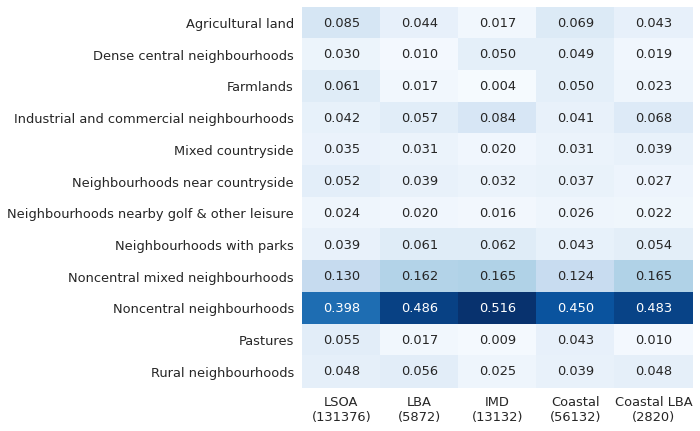

In [58]:
table.columns = cols
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(table, ax=ax, annot=True, cmap='Blues', vmin=0, vmax=.52, cbar=False, annot_kws=dict(fontsize=13), fmt='.3f')
plt.yticks(fontsize=13)
plt.xticks(fontsize=13,)
plt.savefig('../../diagrams/proportions_per_type.png', dpi=300, bbox_inches="tight")

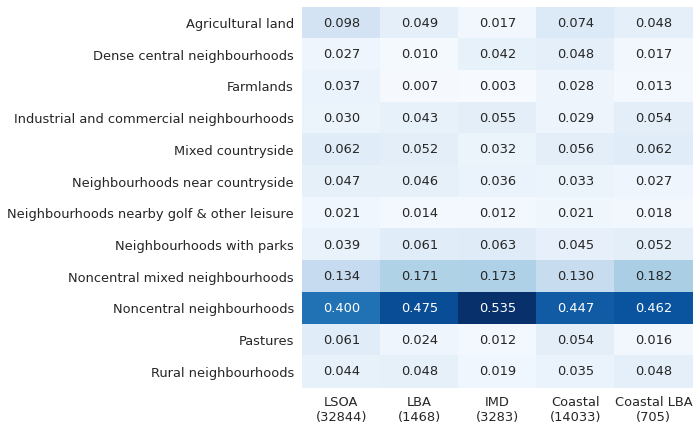

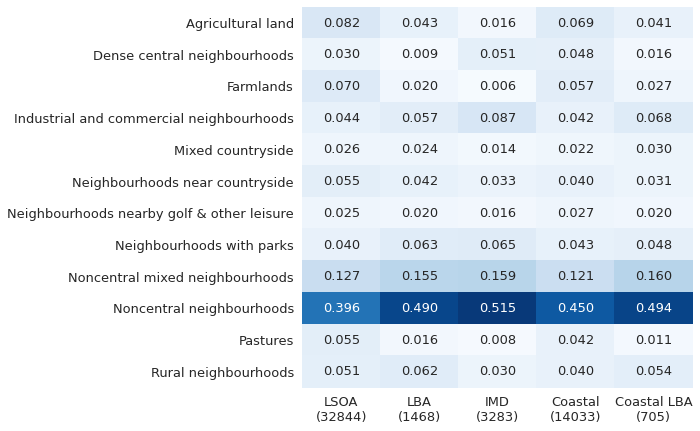

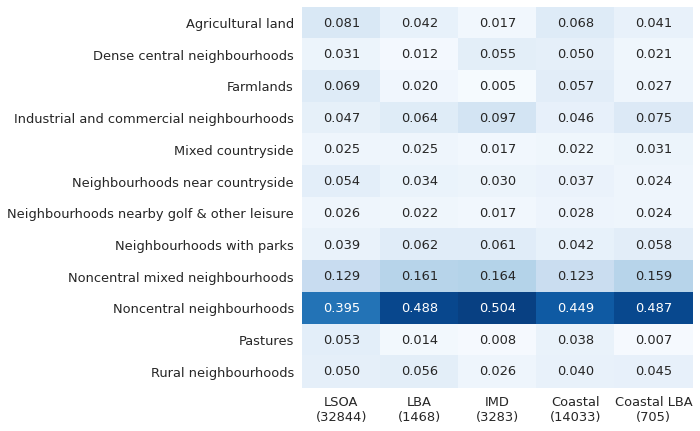

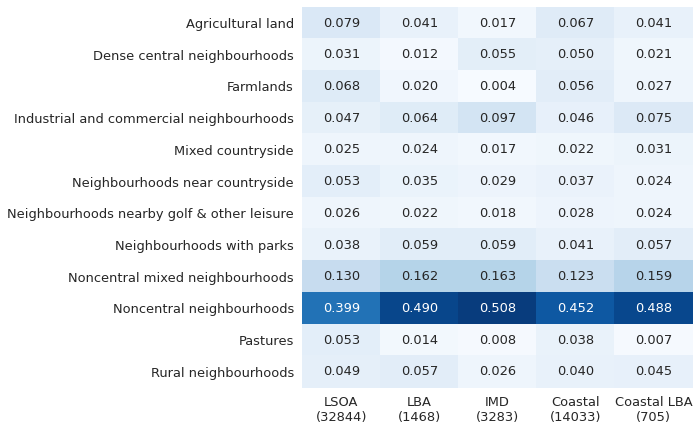

In [64]:
by_year = {}
for y in [2000, 2006, 2012, 2018]:
    tab = pd.DataFrame({f'LSOA\n({lsoa.shape[0]})': lsoa.groupby(f"clusters_12_{y}").count()['final'] / lsoa.shape[0],
                         f'LBA\n({lsoa[lsoa.LBA].shape[0]})': lsoa[lsoa.LBA].groupby(f"clusters_12_{y}").count()['final'] / lsoa[lsoa.LBA].shape[0],
                         f'IMD\n({deprivated.shape[0]})': deprivated.groupby(f"clusters_12_{y}").count()['final'] / deprivated.shape[0],
                         f'Coastal\n({coast.shape[0]})': coast.groupby(f"clusters_12_{y}").count()['final'] / coast.shape[0],
                         f'Coastal LBA\n({coast[coast.LBA].shape[0]})': coast[coast.LBA].groupby(f"clusters_12_{y}").count()['final'] / coast[coast.LBA].shape[0],})
    tab.index.name = None
    fig, ax = plt.subplots(figsize=(7, 7))
    sns.heatmap(tab, ax=ax, annot=True, cmap='Blues', vmin=0, vmax=.535, cbar=False, annot_kws=dict(fontsize=13), fmt='.3f')
    plt.yticks(fontsize=13)
    plt.xticks(fontsize=13,)
    plt.savefig(f'../../diagrams/proportions_per_type_{y}.png', dpi=300, bbox_inches="tight")
    by_year[y] = tab

In [59]:
means12 = pd.read_csv("../../data/clustering_phase_1/means12.csv", index_col=0)

In [84]:
means12

,Continuous urban fabric,Discontinuous urban fabric,Industrial or commercial units,Road and rail networks and associated land,Port areas,Airports,Mineral extraction sites,Dump sites,Construction sites,Green urban areas,...,Salt marshes,Intertidal flats,Water courses,Water bodies,Coastal lagoons,Estuaries,Sea and ocean,Salines,Burnt areas,Agro-forestry areas
0,0.009478,0.513361,0.020361,0.002169,0.001163,0.000260,0.000470,0.000363,0.000394,0.419085,...,0.000020,0.000378,0.000187,0.002902,0.000000,0.000067,0.000055,0.0,0.0,0.000000
1,0.002370,0.494052,0.010993,0.001042,0.000396,0.000613,0.001639,0.000181,0.000835,0.005524,...,0.000975,0.000773,0.000054,0.001712,0.000011,0.000169,0.000175,0.0,0.0,0.000000
2,0.003978,0.178959,0.021642,0.005372,0.035216,0.010441,0.014052,0.002041,0.007640,0.006695,...,0.005880,0.003098,0.000092,0.011648,0.000005,0.000433,0.000507,0.0,0.0,0.000000
3,0.000217,0.074236,0.009703,0.000956,0.000213,0.003055,0.003658,0.000859,0.001115,0.000428,...,0.001689,0.000699,0.000117,0.002252,0.000010,0.000099,0.000086,0.0,0.0,0.000006
4,0.772865,0.192465,0.012240,0.000633,0.003716,0.000000,0.000000,0.000000,0.000520,0.008849,...,0.000002,0.001608,0.000250,0.000103,0.000000,0.000183,0.000103,0.0,0.0,0.000000
5,0.002133,0.979190,0.002649,0.000250,0.000187,0.000047,0.000026,0.000003,0.000063,0.003771,...,0.000028,0.000269,0.000059,0.000064,0.000000,0.000094,0.000090,0.0,0.0,0.000000
6,0.018738,0.324462,0.531822,0.003039,0.007711,0.002444,0.000809,0.000618,0.002049,0.027470,...,0.000963,0.000596,0.000251,0.002623,0.000000,0.000580,0.000208,0.0,0.0,0.000000
7,0.001050,0.449794,0.017396,0.001123,0.000597,0.000903,0.002950,0.000748,0.002041,0.005131,...,0.000525,0.001027,0.000098,0.001582,0.000000,0.000216,0.000134,0.0,0.0,0.000000
8,0.041074,0.731992,0.041840,0.003759,0.002925,0.001064,0.001254,0.000205,0.001422,0.031310,...,0.000618,0.001338,0.000178,0.001874,0.000008,0.000271,0.000250,0.0,0.0,0.000000
9,0.000415,0.111565,0.012612,0.001077,0.000187,0.001203,0.003852,0.000305,0.000865,0.001381,...,0.002182,0.001255,0.000026,0.002213,0.000081,0.000209,0.000118,0.0,0.0,0.000000


In [57]:
idx = ["Neighbourhoods with parks",
"Neighbourhoods near countryside",
"Mixed countryside",
"Agricultural land",
"Dense central neighbourhoods",
"Non-central neighbourhoods",
"Industrial and commercial neighbourhoods",
"Rural neighbourhoods",
"Non-central mixed neighbourhoods",
"Pastures",
"Farmlands",
"Neighbourhoods nearby golf & other leisure",]

In [58]:
means12.index = idx

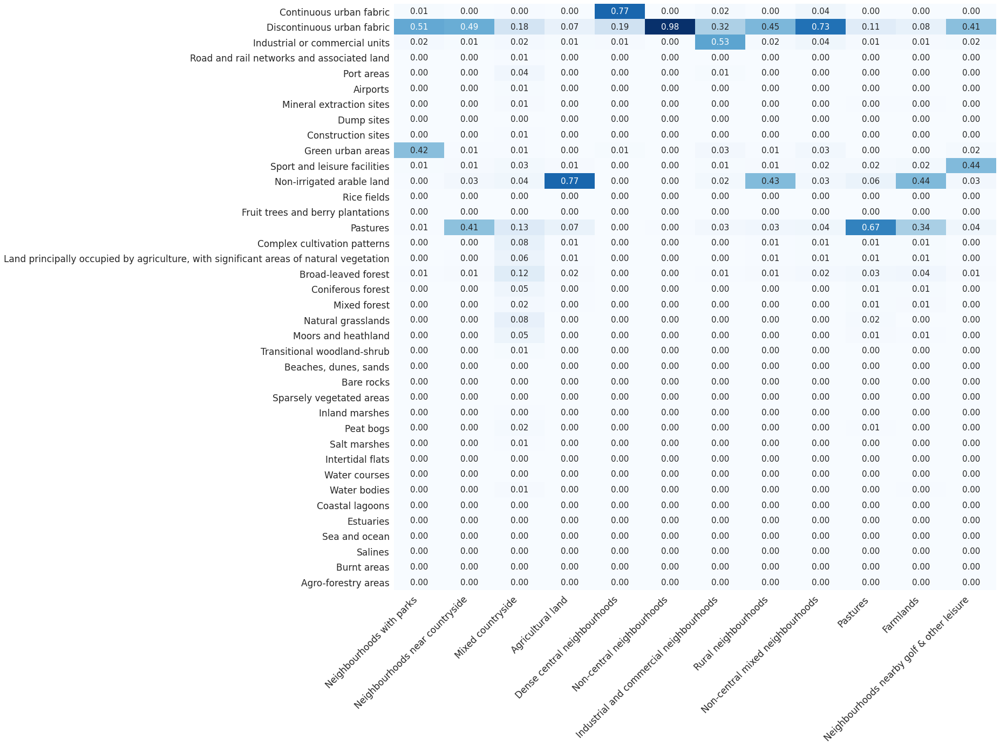

In [167]:
fig, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(means12.T, ax=ax, annot=True, cmap='Blues', fmt='.2f', cbar=False, annot_kws=dict(fontsize=15))
plt.yticks(fontsize=17)
plt.xticks(fontsize=17, rotation=45, ha='right')
plt.savefig("../../diagrams/means12.svg", bbox_inches="tight", dpi=300)

In [42]:
lsoa.final.cat.categories

Index(['Agricultural land', 'Dense central neighbourhoods', 'Farmlands',
       'Industrial and commercial neighbourhoods', 'Mixed countryside',
       'Neighbourhoods near countryside',
       'Neighbourhoods nearby golf & other leisure',
       'Neighbourhoods with parks', 'Noncentral mixed neighbourhoods',
       'Noncentral neighbourhoods', 'Pastures', 'Rural neighbourhoods'],
      dtype='object')

In [43]:
lsoa = lsoa[lsoa.LSOA11CD.str.startswith('E')]

In [33]:
lsoa_clc2000 = gpd.read_parquet("../../data/clustering_phase_1/lsoa_clc2000.pq")
lsoa_clc2006 = gpd.read_parquet("../../data/clustering_phase_1/lsoa_clc2006.pq")
lsoa_clc2012 = gpd.read_parquet("../../data/clustering_phase_1/lsoa_clc2012.pq")
lsoa_clc2018 = gpd.read_parquet("../../data/clustering_phase_1/lsoa_clc2018.pq")

In [228]:
lsoa

,OBJECTID,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,Shape__Are,Shape__Len,...,clusters_10_2012,clusters_10_2018,clusters_12_2000,clusters_12_2006,clusters_12_2012,clusters_12_2018,geometry,sequence,LBA,final
0,Neighbourhoods near countryside,E01000001,City of London 001A,532123,181632,-0.097140,51.5182,2635.767993,129865.314354,2635.767993,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((532151.537 181867.433, 532152.500 18...",NaN,False,Dense central neighbourhoods
1,Mixed countryside,E01000002,City of London 001B,532480,181715,-0.091970,51.5188,2707.881853,228419.634727,2707.881853,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((532634.497 181926.016, 532632.048 18...",NaN,False,Dense central neighbourhoods
2,Agricultural land,E01000003,City of London 001C,532239,182033,-0.095320,51.5217,1224.638192,59054.351929,1224.638192,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((532153.703 182165.155, 532158.250 18...",NaN,False,Dense central neighbourhoods
3,Dense central neighbourhoods,E01000005,City of London 001E,533581,181283,-0.076270,51.5147,2275.805348,189577.710655,2275.805348,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((533619.062 181402.364, 533639.868 18...",NaN,False,Dense central neighbourhoods
4,Noncentral neighbourhoods,E01000006,Barking and Dagenham 016A,544994,184274,0.089317,51.5387,1966.092607,146536.995750,1966.092607,...,Neighbourhoods near countryside,Neighbourhoods near countryside,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,"POLYGON ((545126.852 184310.838, 545145.213 18...",NaN,False,Noncentral neighbourhoods
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32968,32969,E01033748,Liverpool 050I,335220,387649,-2.975330,53.3817,4330.800070,483514.002792,4330.800070,...,Dense central neighbourhoods,Dense central neighbourhoods,Mixed countryside,Mixed countryside,Mixed countryside,Mixed countryside,"MULTIPOLYGON (((334617.399 388176.905, 334607....",NaN,False,Mixed countryside
32969,32970,E01033749,Liverpool 042F,338677,387900,-2.923420,53.3844,2340.702574,202683.753227,2340.702574,...,Agricultural land,Agricultural land,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,"POLYGON ((338929.000 388182.000, 338936.000 38...",Greener Non-central Neighbourhoods,False,Noncentral mixed neighbourhoods
32970,32971,E01033750,Liverpool 061A,334568,388937,-2.985400,53.3932,4937.800257,493691.197838,4937.800257,...,Dense central neighbourhoods,Dense central neighbourhoods,Mixed countryside,Mixed countryside,Mixed countryside,Mixed countryside,"POLYGON ((334442.091 389502.020, 334489.805 38...",NaN,False,Mixed countryside
32971,32972,E01033751,Liverpool 062A,333990,391269,-2.994580,53.4141,4360.410024,597556.173294,4360.410024,...,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,Industrial and commercial neighbourhoods,Industrial and commercial neighbourhoods,Industrial and commercial neighbourhoods,Industrial and commercial neighbourhoods,"POLYGON ((334674.977 391540.458, 334679.726 39...",NaN,False,Industrial and commercial neighbourhoods


## Overview maps

This section creates maps of the whole England and static clusters

In [229]:
%time england = lsoa.dissolve()

CPU times: user 1min 41s, sys: 167 ms, total: 1min 41s
Wall time: 1min 41s


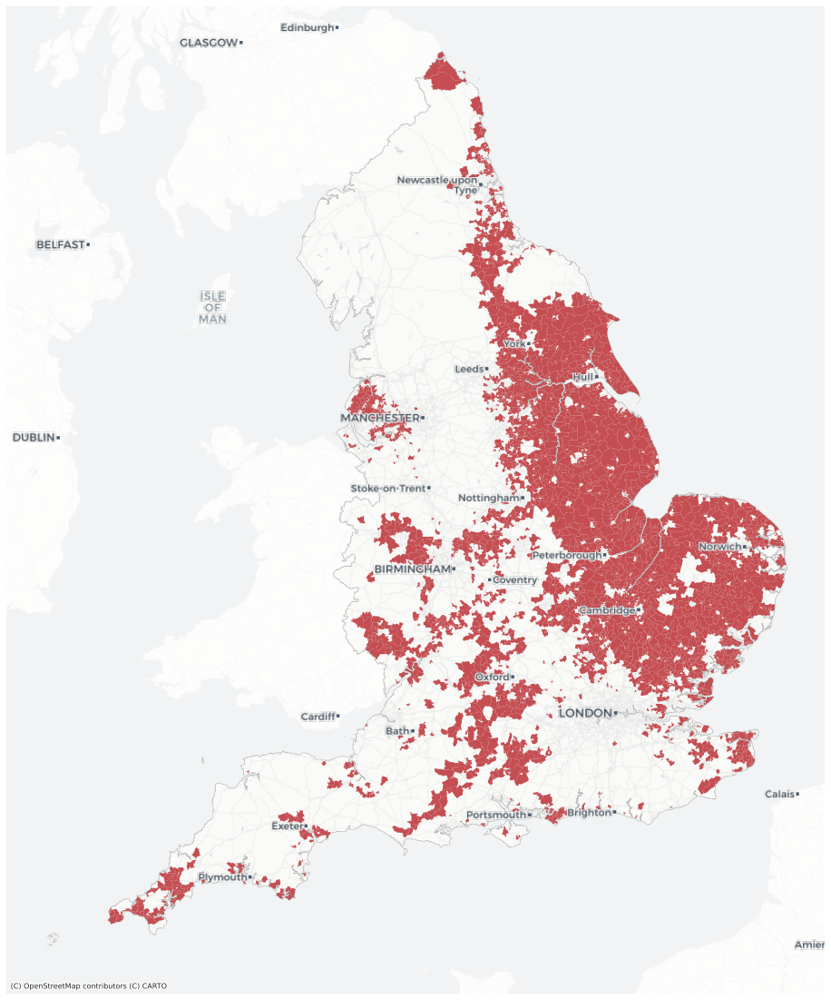

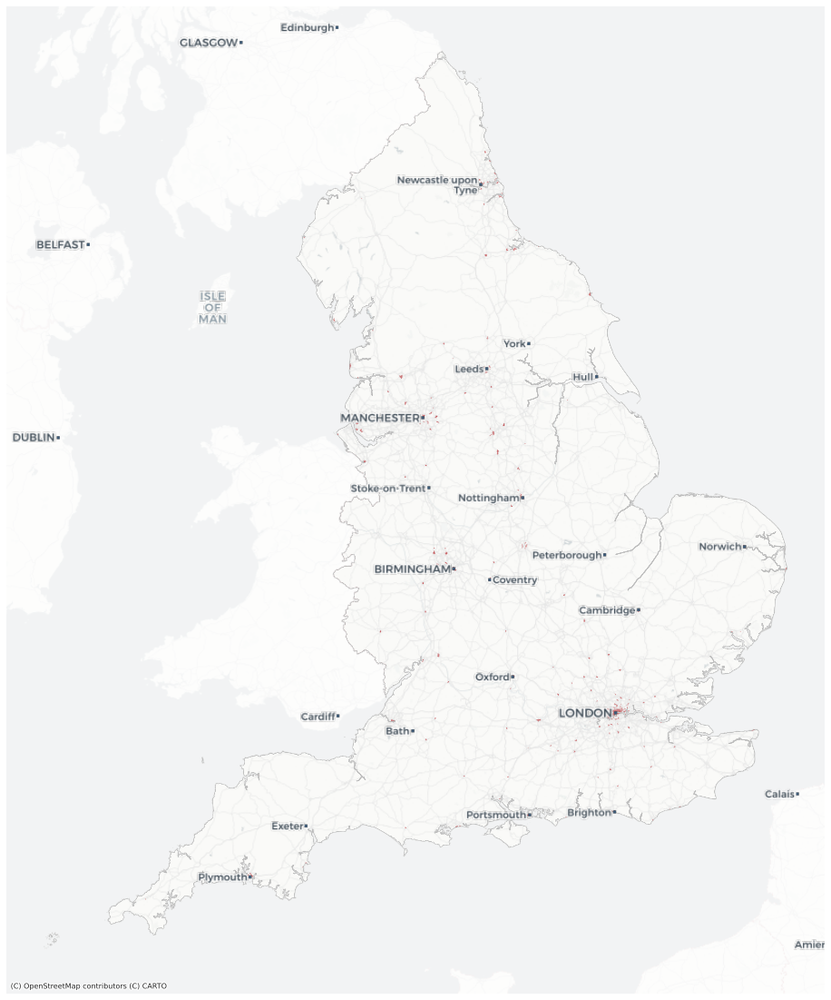

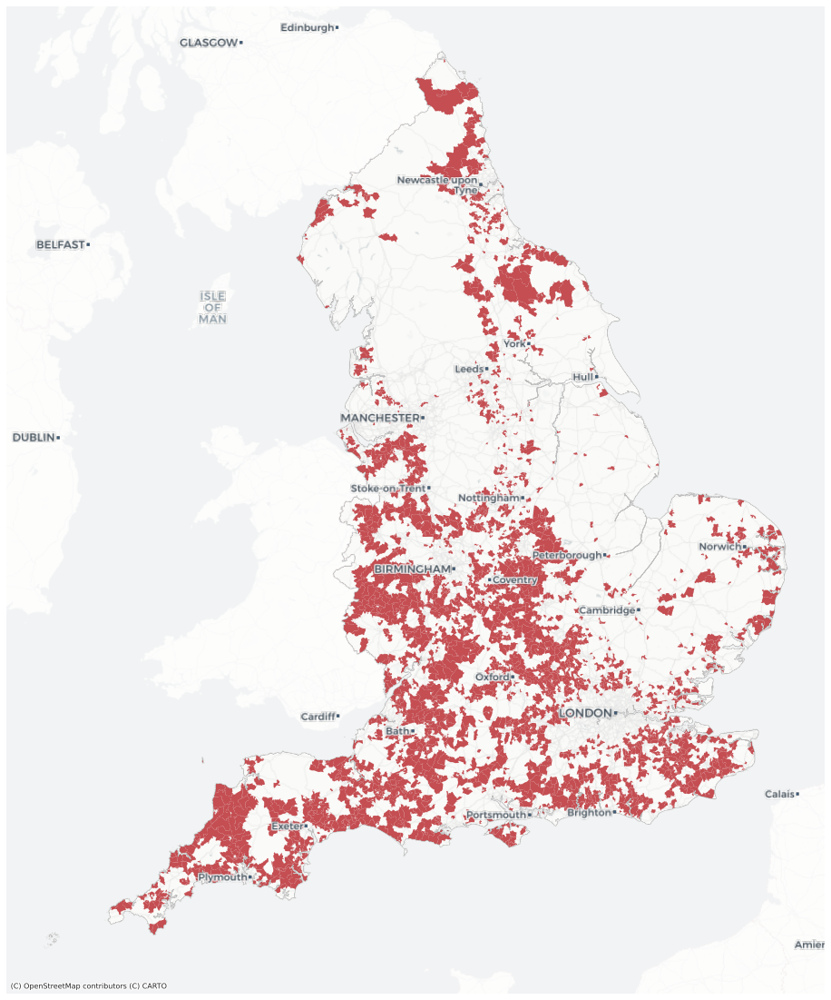

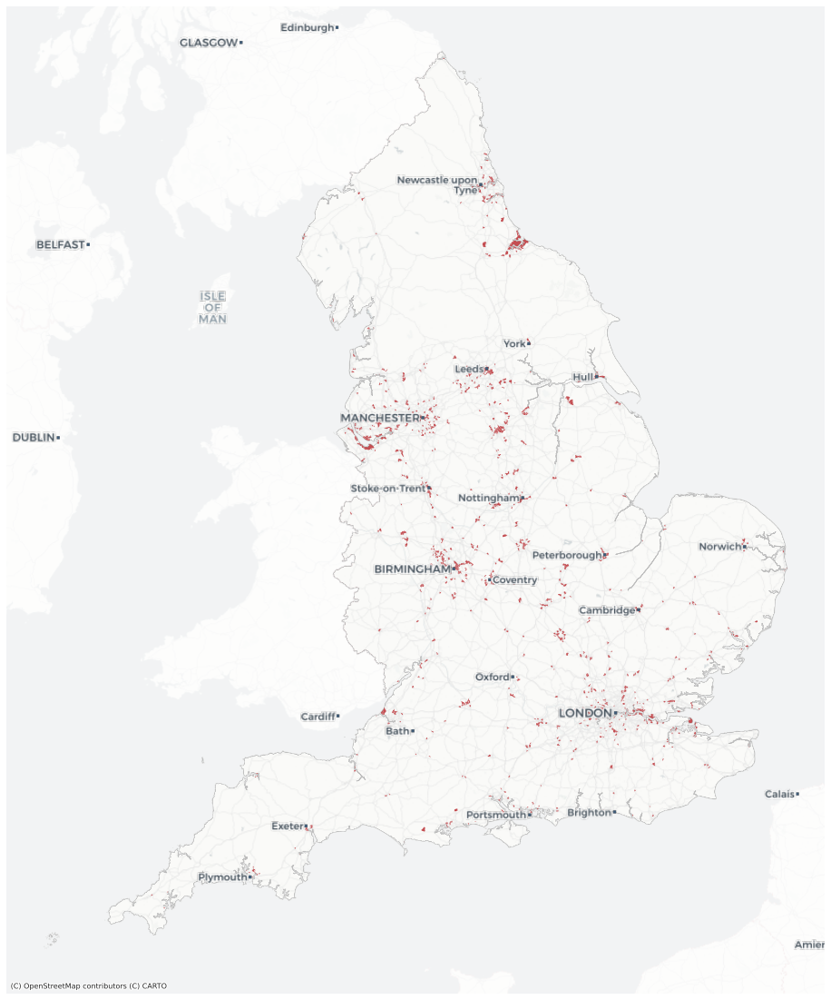

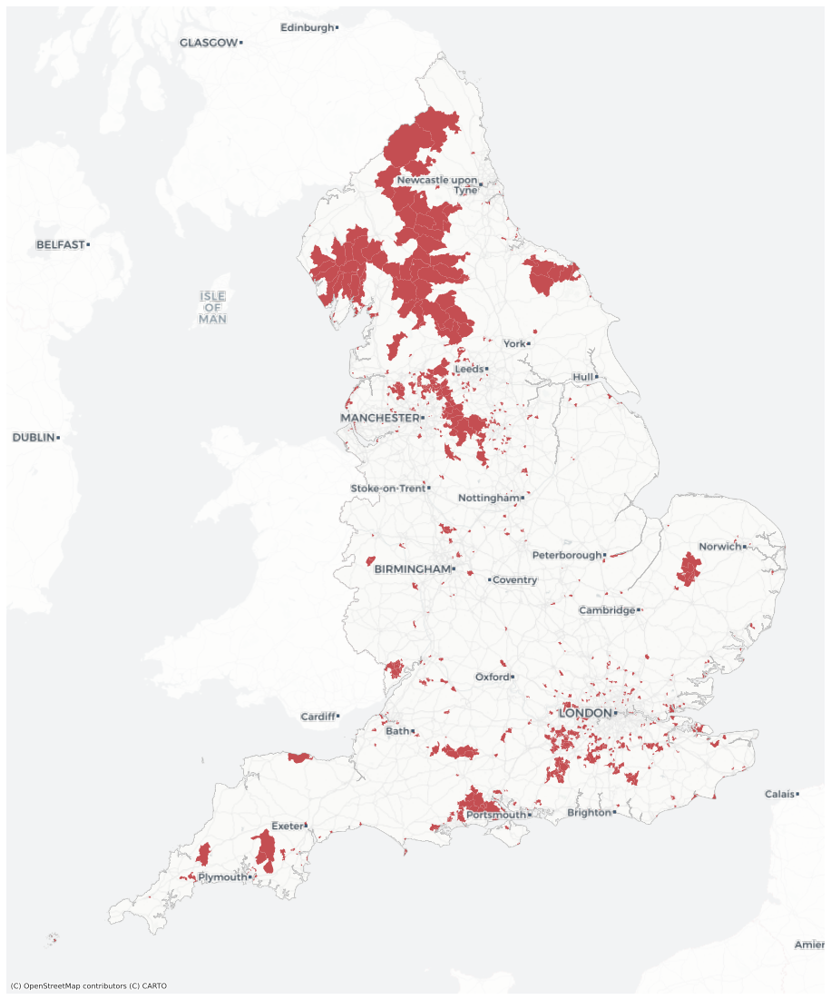

...

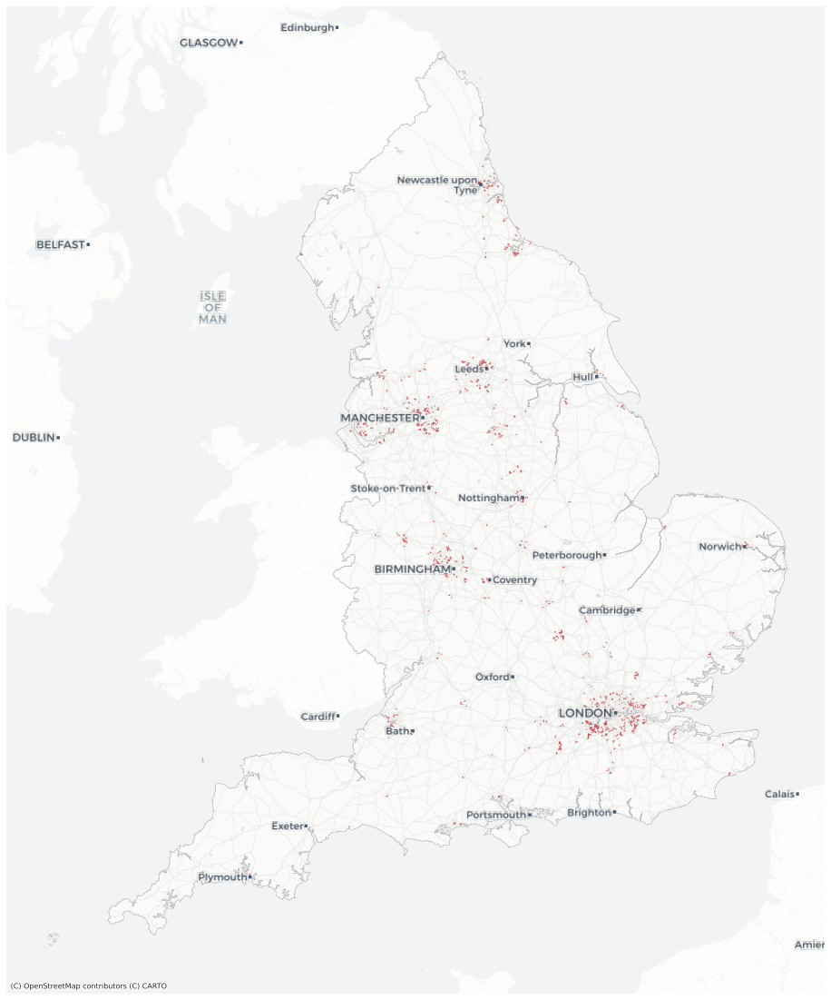

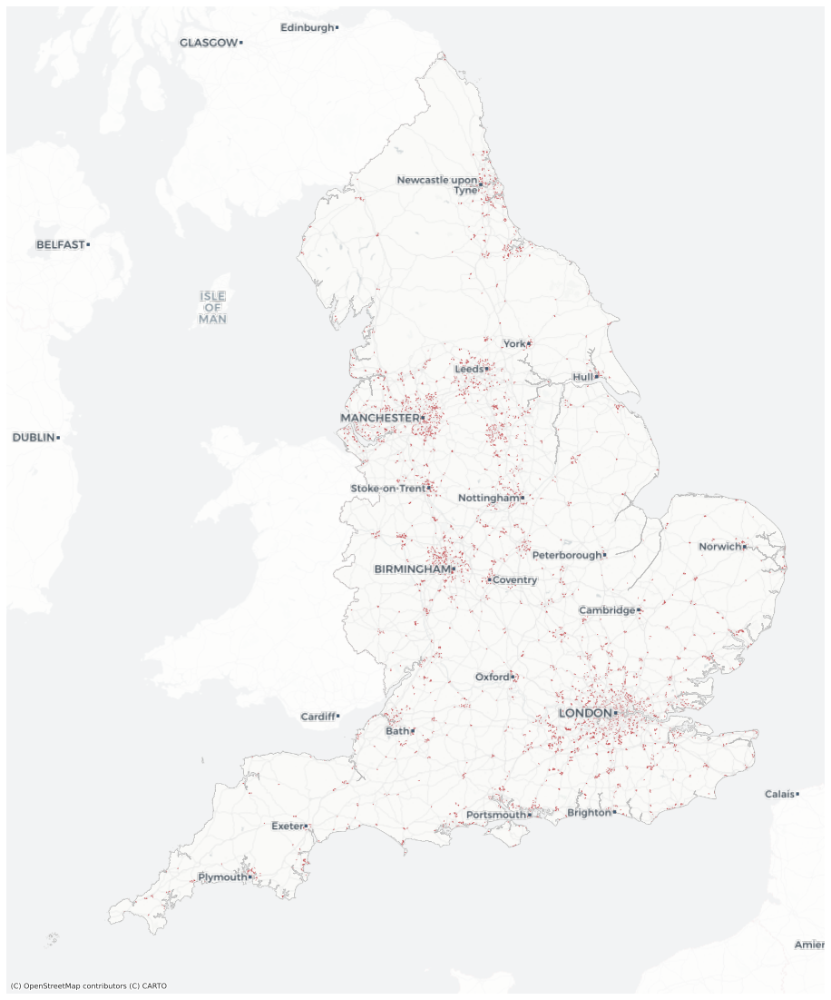

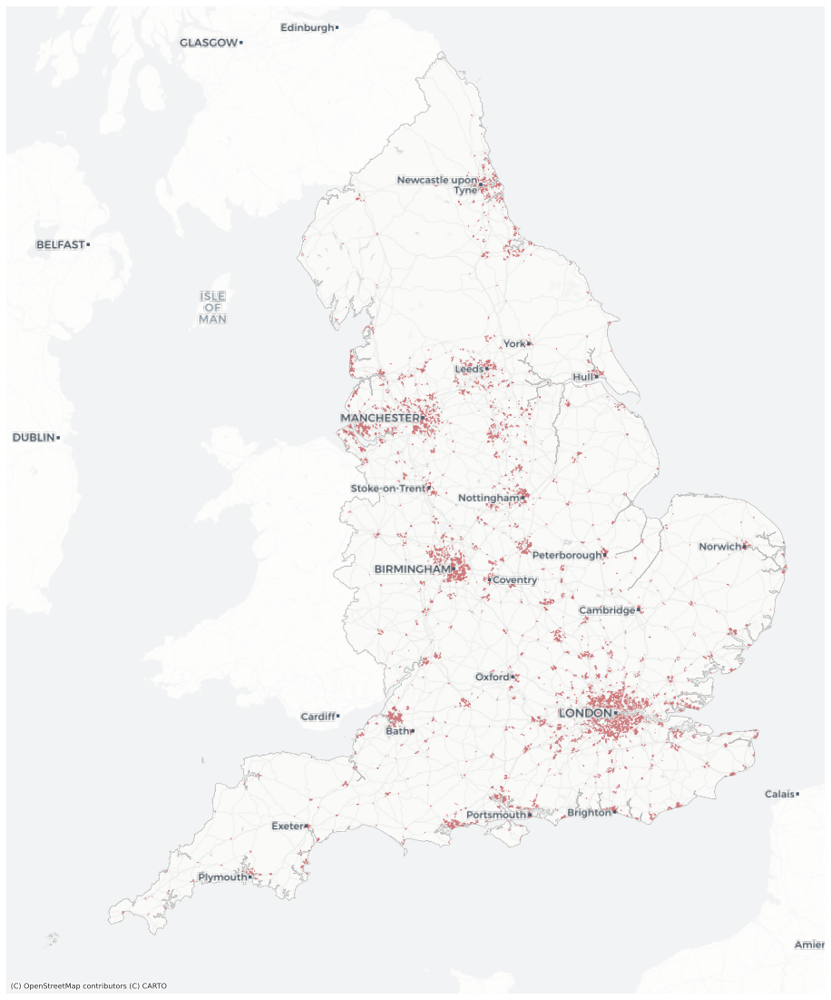

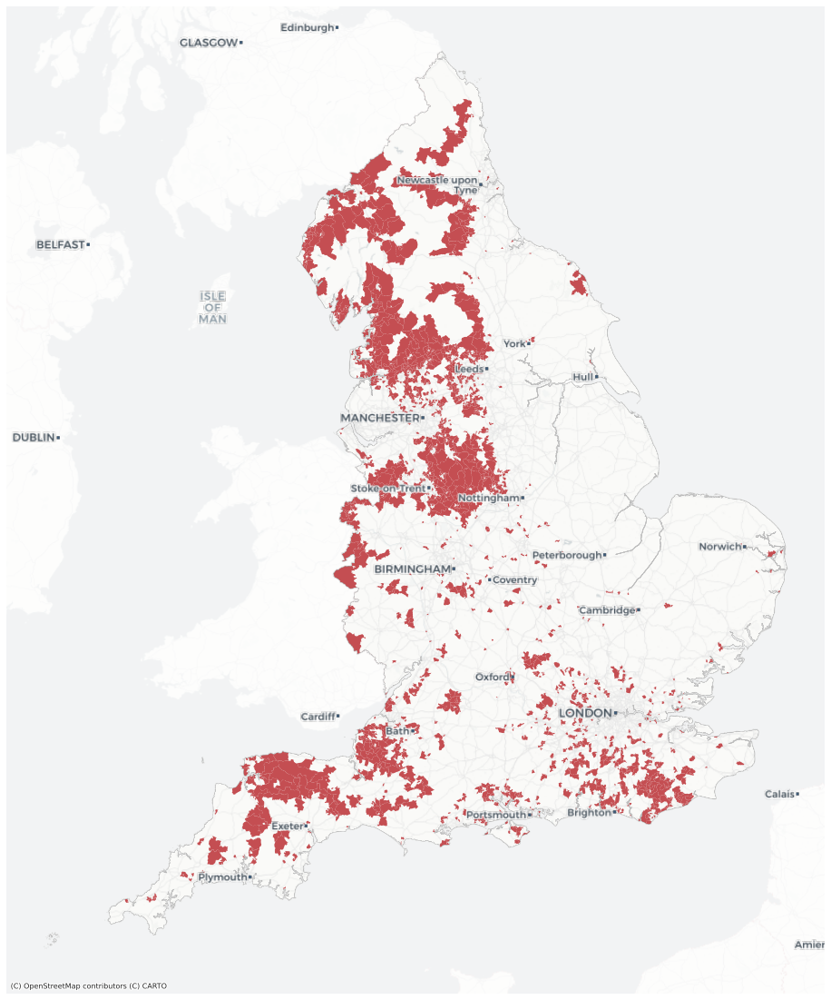

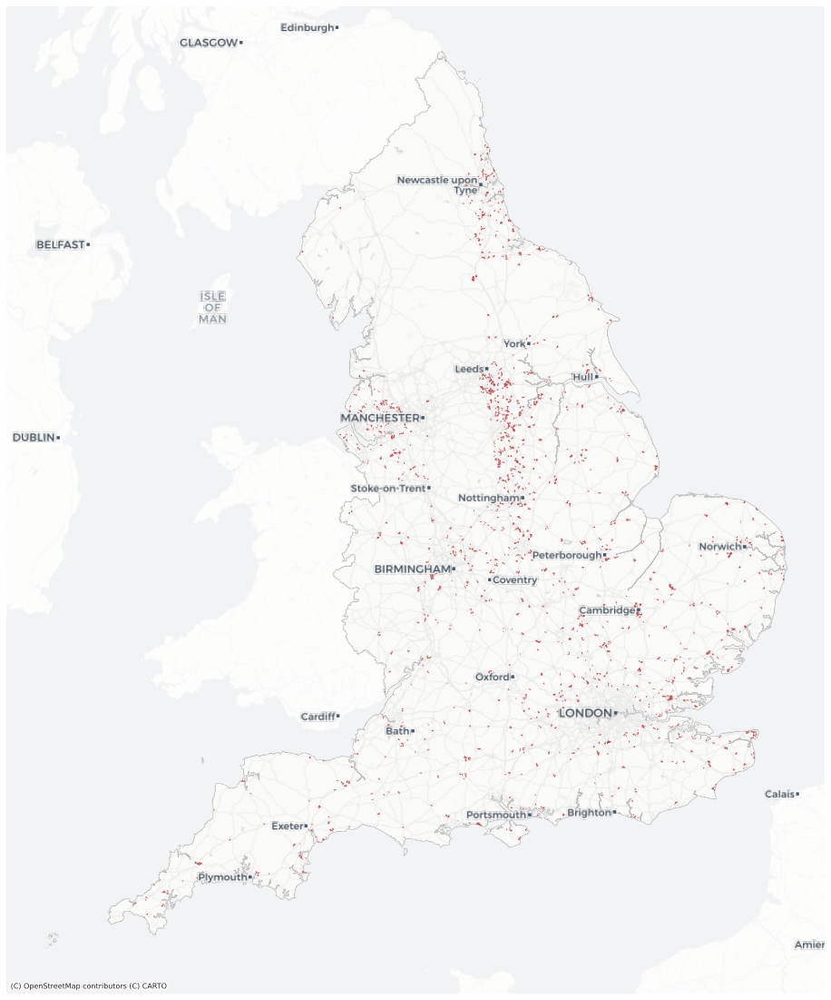

In [162]:
for cat in lsoa.final.cat.categories:
    ax = lsoa[lsoa.final == cat].to_crs(3857).plot(figsize=(20, 20), linewidth=0, alpha=1, color='r')
    england.to_crs(3857).boundary.plot(ax=ax,color='k', linewidth=.6)
    ctx.add_basemap(ax=ax, source=ctx.providers.CartoDB.PositronNoLabels)
    ctx.add_basemap(ax=ax, source=ctx.providers.CartoDB.PositronOnlyLabels, zorder=3)
    gpd.GeoSeries([mask], crs=27700).to_crs(3857).plot(color='w', alpha=.7, zorder=2, ax=ax)
    ax.set_axis_off()
    plt.savefig(f'../../maps/cluster_{cat}_2018.png', dpi=150, bbox_inches="tight")

In [230]:
mask = box(*lsoa.total_bounds).buffer(50000, join_style=2).difference(england.geometry.iloc[0])

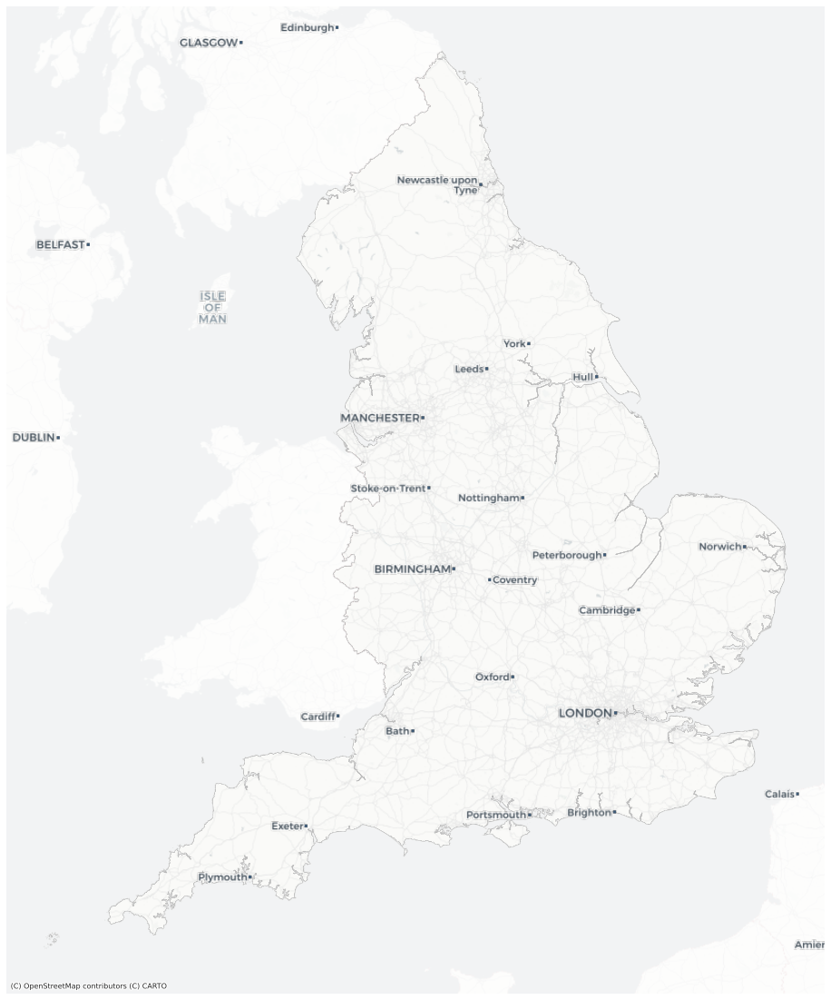

In [232]:
ax = england.to_crs(3857).boundary.plot(figsize=(20, 20),color='k', linewidth=.6)
ctx.add_basemap(ax=ax, source=ctx.providers.CartoDB.PositronNoLabels)
ctx.add_basemap(ax=ax, source=ctx.providers.CartoDB.PositronOnlyLabels, zorder=3)
gpd.GeoSeries([mask], crs=27700).to_crs(3857).plot(color='w', alpha=.7, zorder=2, ax=ax)
ax.set_axis_off()
plt.savefig(f'../../maps/england.png', dpi=150, bbox_inches="tight")

In [175]:
lsoa

,OBJECTID,LSOA11CD,LSOA11NM,BNG_E,BNG_N,LONG_,LAT,Shape_Leng,Shape__Are,Shape__Len,...,clusters_10_2012,clusters_10_2018,clusters_12_2000,clusters_12_2006,clusters_12_2012,clusters_12_2018,geometry,sequence,LBA,final
0,Neighbourhoods near countryside,E01000001,City of London 001A,532123,181632,-0.097140,51.5182,2635.767993,129865.314354,2635.767993,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((532151.537 181867.433, 532152.500 18...",NaN,False,Dense central neighbourhoods
1,Mixed countryside,E01000002,City of London 001B,532480,181715,-0.091970,51.5188,2707.881853,228419.634727,2707.881853,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((532634.497 181926.016, 532632.048 18...",NaN,False,Dense central neighbourhoods
2,Agricultural land,E01000003,City of London 001C,532239,182033,-0.095320,51.5217,1224.638192,59054.351929,1224.638192,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((532153.703 182165.155, 532158.250 18...",NaN,False,Dense central neighbourhoods
3,Dense central neighbourhoods,E01000005,City of London 001E,533581,181283,-0.076270,51.5147,2275.805348,189577.710655,2275.805348,...,Neighbourhoods with parks,Neighbourhoods with parks,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,"POLYGON ((533619.062 181402.364, 533639.868 18...",NaN,False,Dense central neighbourhoods
4,Noncentral neighbourhoods,E01000006,Barking and Dagenham 016A,544994,184274,0.089317,51.5387,1966.092607,146536.995750,1966.092607,...,Neighbourhoods near countryside,Neighbourhoods near countryside,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,"POLYGON ((545126.852 184310.838, 545145.213 18...",NaN,False,Noncentral neighbourhoods
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32968,32969,E01033748,Liverpool 050I,335220,387649,-2.975330,53.3817,4330.800070,483514.002792,4330.800070,...,Dense central neighbourhoods,Dense central neighbourhoods,Mixed countryside,Mixed countryside,Mixed countryside,Mixed countryside,"MULTIPOLYGON (((334617.399 388176.905, 334607....",NaN,False,Mixed countryside
32969,32970,E01033749,Liverpool 042F,338677,387900,-2.923420,53.3844,2340.702574,202683.753227,2340.702574,...,Agricultural land,Agricultural land,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,"POLYGON ((338929.000 388182.000, 338936.000 38...",Greener Non-central Neighbourhoods,False,Noncentral mixed neighbourhoods
32970,32971,E01033750,Liverpool 061A,334568,388937,-2.985400,53.3932,4937.800257,493691.197838,4937.800257,...,Dense central neighbourhoods,Dense central neighbourhoods,Mixed countryside,Mixed countryside,Mixed countryside,Mixed countryside,"POLYGON ((334442.091 389502.020, 334489.805 38...",NaN,False,Mixed countryside
32971,32972,E01033751,Liverpool 062A,333990,391269,-2.994580,53.4141,4360.410024,597556.173294,4360.410024,...,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,Industrial and commercial neighbourhoods,Industrial and commercial neighbourhoods,Industrial and commercial neighbourhoods,Industrial and commercial neighbourhoods,"POLYGON ((334674.977 391540.458, 334679.726 39...",NaN,False,Industrial and commercial neighbourhoods


## Prepare data for CARTO interactive map

Data for an interactive map needs simplified geometry.

In [176]:
generalised = gpd.read_file("https://opendata.arcgis.com/datasets/8bbadffa6ddc493a94078c195a1e293b_0.zip?outSR=%7B%22latestWkid%22%3A27700%2C%22wkid%22%3A27700%7D")

In [178]:
generalised = generalised[generalised.LSOA11CD.str.startswith('E')]

In [180]:
generalised = generalised[["LSOA11CD", "LSOA11NM", 'geometry']].merge(lsoa[["LSOA11CD", "clusters_12_2000", "clusters_12_2006", "clusters_12_2012", "clusters_12_2018", "LBA"]], on="LSOA11CD")

In [199]:
generalised

,LSOA11CD,LSOA11NM,geometry,clusters_12_2000,clusters_12_2006,clusters_12_2012,clusters_12_2018,LBA,pens2018,pens2012,pens2006,pens2000
0,E01000001,City of London 001A,"POLYGON ((532105.092 182011.231, 532162.491 18...",Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,False,"This class is made up almost entirely of ""cont...","This class is made up almost entirely of ""cont...","This class is made up almost entirely of ""cont...","This class is made up almost entirely of ""cont..."
1,E01000002,City of London 001B,"POLYGON ((532634.497 181926.016, 532619.141 18...",Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,False,"This class is made up almost entirely of ""cont...","This class is made up almost entirely of ""cont...","This class is made up almost entirely of ""cont...","This class is made up almost entirely of ""cont..."
2,E01000003,City of London 001C,"POLYGON ((532135.138 182198.131, 532158.250 18...",Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,False,"This class is made up almost entirely of ""cont...","This class is made up almost entirely of ""cont...","This class is made up almost entirely of ""cont...","This class is made up almost entirely of ""cont..."
3,E01000005,City of London 001E,"POLYGON ((533808.018 180767.774, 533649.037 18...",Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,False,"This class is made up almost entirely of ""cont...","This class is made up almost entirely of ""cont...","This class is made up almost entirely of ""cont...","This class is made up almost entirely of ""cont..."
4,E01000006,Barking and Dagenham 016A,"POLYGON ((545122.049 184314.931, 545271.849 18...",Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,False,"This class is made up almost entirely of ""disc...","This class is made up almost entirely of ""disc...","This class is made up almost entirely of ""disc...","This class is made up almost entirely of ""disc..."
...,...,...,...,...,...,...,...,...,...,...,...,...
32839,E01033764,Liverpool 022E,"POLYGON ((334934.599 393421.116, 334921.819 39...",Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,Noncentral neighbourhoods,False,"This class is made up almost entirely of ""disc...","This class is made up almost entirely of ""disc...","This class is made up almost entirely of ""disc...","This class is made up almost entirely of ""disc..."
32840,E01033765,Liverpool 061D,"POLYGON ((335087.000 388951.000, 335125.000 38...",Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,False,This class is made up of “discontinuous urban ...,This class is made up of “discontinuous urban ...,This class is made up of “discontinuous urban ...,This class is made up of “discontinuous urban ...
32841,E01033766,Liverpool 042G,"POLYGON ((338804.207 388364.881, 338831.644 38...",Noncentral neighbourhoods,Noncentral neighbourhoods,Dense central neighbourhoods,Dense central neighbourhoods,False,"This class is made up almost entirely of ""cont...","This class is made up almost entirely of ""cont...","This class is made up almost entirely of ""disc...","This class is made up almost entirely of ""disc..."
32842,E01033767,Liverpool 050J,"POLYGON ((335584.014 387799.682, 335678.000 38...",Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,Noncentral mixed neighbourhoods,False,This class is made up of “discontinuous urban ...,This class is made up of “discontinuous urban ...,This class is made up of “discontinuous urban ...,This class is made up of “discontinuous urban ...


In [190]:
generalised['pens2018'] = generalised.clusters_12_2018.apply(lambda x: pens[x])
generalised['pens2012']  = generalised.clusters_12_2012.apply(lambda x: pens[x])
generalised['pens2006']  = generalised.clusters_12_2006.apply(lambda x: pens[x])
generalised['pens2000']  = generalised.clusters_12_2000.apply(lambda x: pens[x])

In [203]:
generalised.to_file("../../data/static_carto.gpkg", driver="GPKG")

In [205]:
generalised.clusters_12_2000.value_counts()

Noncentral neighbourhoods                     13137
Noncentral mixed neighbourhoods                4413
Agricultural land                              3231
Mixed countryside                              2040
Pastures                                       1993
Neighbourhoods near countryside                1542
Rural neighbourhoods                           1440
Neighbourhoods with parks                      1281
Farmlands                                      1210
Industrial and commercial neighbourhoods        991
Dense central neighbourhoods                    892
Neighbourhoods nearby golf & other leisure      674
Name: clusters_12_2000, dtype: int64

## Analyse coastal areas

To analyse coastal areas we load coastline data from GDSL PostGIS DB.

In [34]:
import os
from sqlalchemy import create_engine
user = os.environ.get('DB_USER')
pwd = os.environ.get('DB_PWD')
host = os.environ.get('DB_HOST')
port = os.environ.get('DB_PORT')

In [36]:
db_connection_url = f"postgres+psycopg2://{user}:{pwd}@{host}:{port}/built_env"
engine = create_engine(db_connection_url)

In [37]:
sql = f'SELECT * FROM gb_coastline_2016'
coastline = gpd.read_postgis(sql, engine, geom_col='geometry')

In [67]:
coastline

,CODE,LEGEND,AMENDED,geometry
0,5110,Coastline (Natural),1993-01-01,"LINESTRING (85970.000 14510.000, 85940.000 145..."
1,5110,Coastline (Natural),1993-01-01,"LINESTRING (86170.000 14440.000, 86200.000 144..."
2,5110,Coastline (Natural),1993-01-01,"LINESTRING (86330.000 13970.000, 86350.000 139..."
3,5110,Coastline (Natural),1993-01-01,"LINESTRING (85950.000 13950.000, 85950.000 139..."
4,5110,Coastline (Natural),1993-01-01,"LINESTRING (86080.000 15470.000, 86080.000 154..."
...,...,...,...,...
2403,5110,Coastline (Natural),2014-08-05,"LINESTRING (166426.000 225405.000, 166426.000 ..."
2404,5110,Coastline (Natural),2014-08-05,"LINESTRING (167080.000 225526.000, 167064.000 ..."
2405,5110,Coastline (Natural),2014-08-06,"LINESTRING (171825.000 226293.000, 171839.000 ..."
2406,5110,Coastline (Natural),2014-09-03,"LINESTRING (517572.000 424703.000, 517594.000 ..."


As a coastal area is considered any LSOA within 10 km from the coastline.

In [68]:
inp, res = lsoa.sindex.query_bulk(coastline.geometry.buffer(10000), predicate="intersects")
coast_ix = np.unique(res)
coast = lsoa.iloc[coast_ix]

In [69]:
c00 = coast.clusters_12_2000.value_counts(normalize=True)
c06 = coast.clusters_12_2006.value_counts(normalize=True)
c12 = coast.clusters_12_2012.value_counts(normalize=True)
c18 = coast.clusters_12_2018.value_counts(normalize=True)
heat_coast = pd.DataFrame([c00, c06, c12, c18]).T.sort_index()

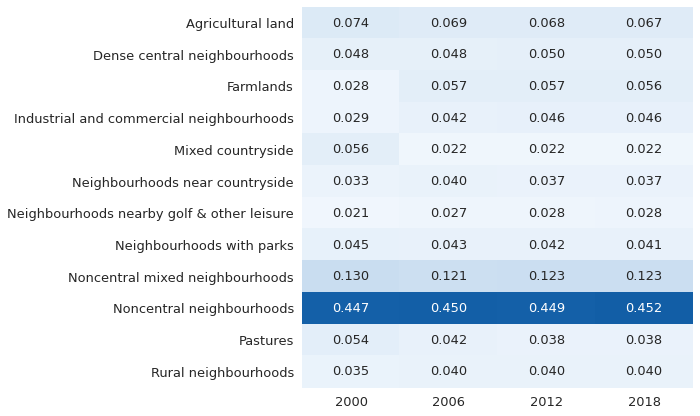

In [86]:
heat_coast.columns = [2000, 2006, 2012, 2018]
 
fig, ax = plt.subplots(figsize=(7, 7))
sns.heatmap(heat_coast, ax=ax, annot=True, cmap='Blues', vmin=0, vmax=.55, cbar=False, annot_kws=dict(fontsize=13), fmt='.3f')
plt.yticks(fontsize=13)
plt.xticks(fontsize=13,)
plt.savefig('../../diagrams/proportion_coastal.png', dpi=300, bbox_inches="tight")